### LIBRARIES

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import scipy.signal
import soundfile as sf
from tqdm import tqdm
from scipy.signal import butter, filtfilt, correlate
import scipy.stats
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
from typing import Union, Tuple
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import f_classif, mutual_info_classif
import yaml
import re
from collections import Counter

Load parameters and other configuration values.

In [ ]:
# Load audio processing constants from config.yaml
with open("config.yaml", "r") as f:
    config = yaml.safe_load(f)

SAMPLING_RATE = config["audio_processing"]["sampling_rate"] # Resample the audio files with frequency 4 kHz, since wheezes and crackles are typically within frequency range 0–2 kHz
FRAME_LENGTH = config["audio_processing"]["frame_length"] # Use window size of 60 ms for each cycle
HOP_LENGTH = config["audio_processing"]["hop_length"] # Use 50% overlap
N_MFCC = config["audio_processing"]["n_mfcc"] # Extract the first 13 MFCCs
N_MELS = config["audio_processing"]["n_mels"] # Use 64 Mel Banks to extract the Log-Mel Spectrograms
F_HI = config["audio_processing"]["f_hi"] # Boundary frequency for VLTP is set to 2 kHz
TARGET_DURATION = config["audio_processing"]["target_duration"] # Fix the duration of each cycle to 8 s

FRAME_SIZE = int(FRAME_LENGTH*SAMPLING_RATE) # Calculate the amount of samples per frame
HOP_SIZE = int(HOP_LENGTH*SAMPLING_RATE) #  Calculate the amount of samples per hop

# Load basic paths from config.yaml
DATA_FOLDER = os.path.join(os.getcwd(), config["paths"]["data_folder"])
AUDIO_FOLDER = os.path.join(os.getcwd(), config["paths"]["audio_folder"])
OUTPUT_FOLDER = os.path.join(os.getcwd(), config["paths"]["output_folder"])
RAW_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["raw_cycle_folder"])
AUG_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["aug_cycle_folder"])
CLEANED_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["cleaned_cycle_folder"])
FINAL_CSV = os.path.join(os.getcwd(), config["paths"]["final_csv"])

os.makedirs(OUTPUT_FOLDER, exist_ok=True)
os.makedirs(RAW_CYCLE_FOLDER, exist_ok=True)
os.makedirs(AUG_CYCLE_FOLDER, exist_ok=True)
os.makedirs(CLEANED_CYCLE_FOLDER, exist_ok=True)

# === Feature names ===
FEATURE_NAMES = (
    [f"MFCC_{i}" for i in range(N_MFCC)] +
    ["Spectral Centroid", "Spectral Bandwidth", "Zero Crossing Rate", "RMS Energy",
     "Spectral Rolloff", "Spectral Flux", "Spectral Flatness", "LogMel_Mean", "LogMel_Std"]
)

# Number of features used
N_FEATURES = len(FEATURE_NAMES) 

# Number of frames
N_FRAMES=267

# === Device names ===
devices = ["AKGC417L", "LittC2SE", "Litt3200", "Meditron"]

REFERENCE_DEVICE = "AKGC417L"

Visualize class imbalance on the initial dataset to see if we need to handle underrepresented classes.

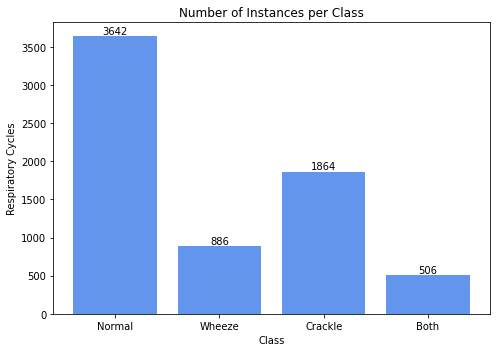

In [12]:
from utils.audio_preprocessing_utils import classify 

all_labels = []

for file in os.listdir(AUDIO_FOLDER):
    if file.endswith(".txt"):
        txt_path = os.path.join(AUDIO_FOLDER, file)
        annotations = np.loadtxt(txt_path)

        for row in annotations:
            _, _, crackle, wheeze = row
            label = classify(int(crackle), int(wheeze))
            all_labels.append(label)

# Calculate frequencies
label_counts = Counter(all_labels)

# Bar plot
plt.figure(figsize=(7, 5))
plt.bar(label_counts.keys(), label_counts.values(), color="cornflowerblue")
plt.title("Number of Instances per Class")
plt.xlabel("Class")
plt.ylabel("Respiratory Cycles")

for i, (label, count) in enumerate(label_counts.items()):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

### PREPROCESSING

For the preprocessing we apply the following pipeline: 
1. **Resample** all .wav files with SAMPLING RATE = 4 kHz
2. **Split all .wav files into respiratory cycles** using the annotation files and **fix their length into 8s using circular padding**
3. Split the respiratory cycles into **training and testing set**
4. Locate which classes are underrepresented in training set and **apply VLTP to handle class imbalance** and enhance the robustness of time-domain acoustic features
5. Apply on every cycle of both training and testing set a **highpass filter with cut-off frequency = 50 Hz** to remove heart sounds and silent environmental noise. Also **normalize the signal amplitude in the interval [-1,1]**

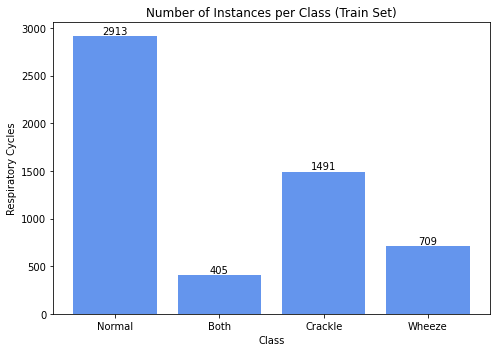

In [24]:
from utils.audio_preprocessing_utils import (
    fix_cycle_length, classify, apply_vtlp,
    preprocess_audio
)

# Steps 1 & 2: Resample and segment raw audio files into respiratory cycles using annotation files
raw_rows = []
for file in os.listdir(AUDIO_FOLDER):
    if file.endswith(".wav"):
        name = file.replace(".wav", "")
        txt_path = os.path.join(AUDIO_FOLDER, name + ".txt")
        if not os.path.exists(txt_path):
            continue

        y, sr = librosa.load(os.path.join(AUDIO_FOLDER, file), sr=SAMPLING_RATE)
        annotations = np.loadtxt(txt_path)

        for i, (start, end, crackle, wheeze) in enumerate(annotations):
            y_seg = fix_cycle_length(y[int(start * sr):int(end * sr)], sr, target_duration=TARGET_DURATION)
            if len(y_seg) < 2 or np.isnan(y_seg).any():
                print(f"Skipping invalid segment: {name}_cycle{i}")
                continue
            fname = f"{name}_cycle{i}.wav"
            sf.write(os.path.join(RAW_CYCLE_FOLDER, fname), y_seg, sr)
            raw_rows.append([fname, int(crackle), int(wheeze)])

df = pd.DataFrame(raw_rows, columns=["file", "crackle", "wheeze"])
df["class"] = df.apply(lambda r: classify(r["crackle"], r["wheeze"]), axis=1)

# Step 3: Split cycles into train/test sets for the classification
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df["class"], random_state=42)
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Visualize class imbalance in training set
label_counts = Counter(train_df["class"])

plt.figure(figsize=(7, 5))
plt.bar(label_counts.keys(), label_counts.values(), color="cornflowerblue")
plt.title("Number of Instances per Class (Training Set)")
plt.xlabel("Class")
plt.ylabel("Respiratory Cycles")

for i, (label, count) in enumerate(label_counts.items()):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

The bar chart shows a **clear class imbalance in the training set**. Specifically, the **"Normal" class dominates** the dataset with significantly more samples compared to the "Crackle", "Wheeze", and especially "Both" classes. This imbalance may lead to biased model performance, so we handle it by appling **VLTP Data Augmentation** on the training set.

In [25]:
# Step 4: Apply VTLP-based class balancing only on training set to avoid augmented data leakage into testing set
class_counts = train_df["class"].value_counts()
max_count = class_counts.max()
augmented_labels = []

for cls in train_df["class"].unique():
    df_cls = train_df[train_df["class"] == cls]
    n_needed = max_count - len(df_cls)

    for i in tqdm(range(n_needed), desc=f"Augmenting {cls}"):
        row = df_cls.sample(1).iloc[0]
        path = os.path.join(RAW_CYCLE_FOLDER, row["file"])
        y, sr = librosa.load(path, sr=SAMPLING_RATE)
        y_aug = apply_vtlp(
            y, sr,
            frame_size=FRAME_SIZE,
            hop_size=HOP_SIZE,
            n_mels=N_MELS,
            f_hi=F_HI,
            alpha=np.random.uniform(0.9, 1.1)
        )
        y_aug = fix_cycle_length(y_aug, sr, target_duration=TARGET_DURATION)
        fname = f"AUG_{row['file'].replace('.wav', '')}_vtlp{i}.wav"
        sf.write(os.path.join(AUG_CYCLE_FOLDER, fname), y_aug, sr)

        augmented_labels.append({
            "file": fname,
            "crackle": int(row["crackle"]),
            "wheeze": int(row["wheeze"]),
            "class": classify(int(row["crackle"]), int(row["wheeze"]))
        })

augmented_labels_df = pd.DataFrame(augmented_labels)

Augmenting Normal: 0it [00:00, ?it/s]
Augmenting Wheeze: 100%|██████████| 2204/2204 [13:59<00:00,  2.63it/s] 


In [ ]:
# After the augmentation we check if each label is indeed equally represented
final_train_df = pd.concat([train_df, augmented_labels_df], ignore_index=True) # Combine raw and augmneted cycles for training set
print("\nClass distribution in training set after augmentation:")
for cls, count in final_train_df["class"].value_counts().items():
    print(f"{cls}: {count} instances")

final_df = pd.concat([final_train_df, test_df], ignore_index=True)


Class distribution in training set after augmentation:
Both: 2913 instances
Wheeze: 2913 instances
Crackle: 2913 instances
Normal: 2913 instances


In [ ]:
# Step 5: Preprocess both sets
for fname in tqdm(final_df["file"], desc="Preprocessing all cycles"):
    in_folder = RAW_CYCLE_FOLDER if not fname.startswith("AUG") else AUG_CYCLE_FOLDER
    y, sr = preprocess_audio(os.path.join(in_folder, fname), sr=SAMPLING_RATE)
    sf.write(os.path.join(CLEANED_CYCLE_FOLDER, fname), y, sr)

Preprocessing all cycles: 100%|██████████| 13032/13032 [01:50<00:00, 117.63it/s]


We visualize for example the first 5 .wav files after the preprocessing pipeline. The signal waveform is split into the different respiratory cycles and every respiratory cycle is seen as an independent instance for the classification model.

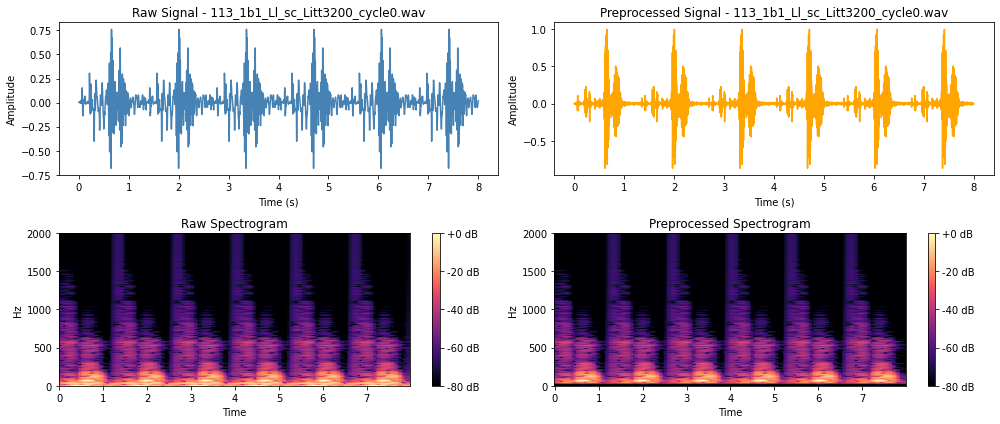

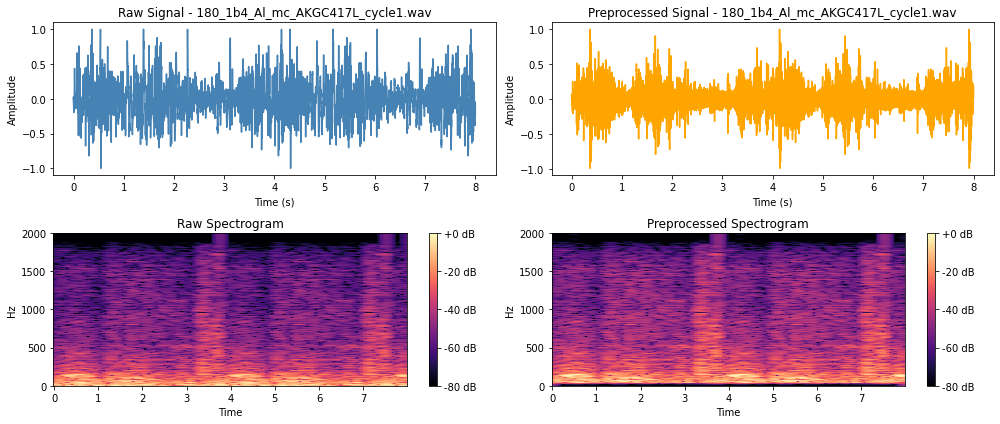

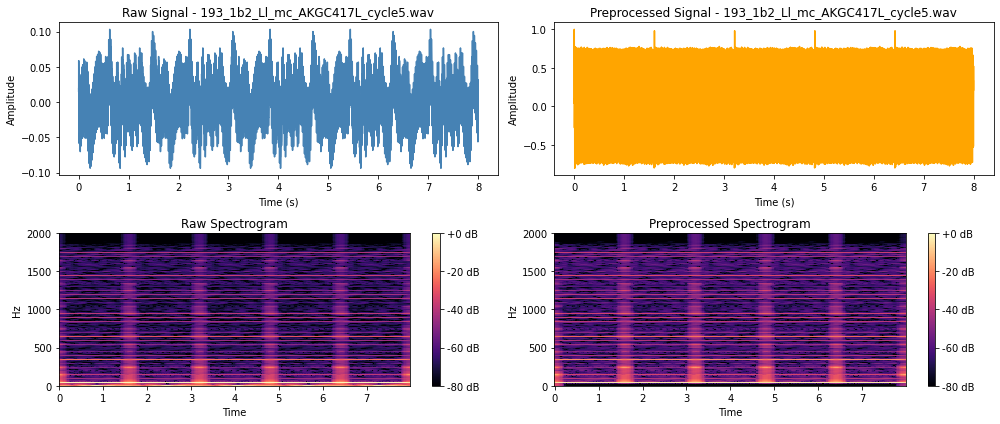

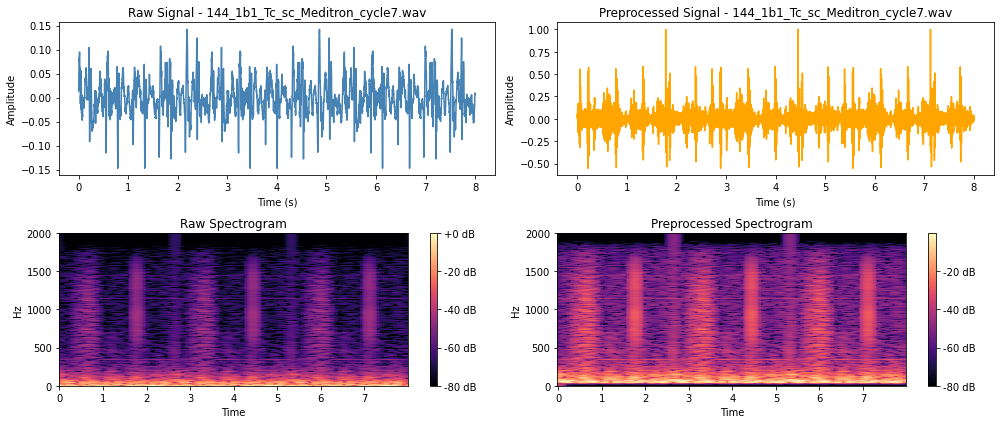

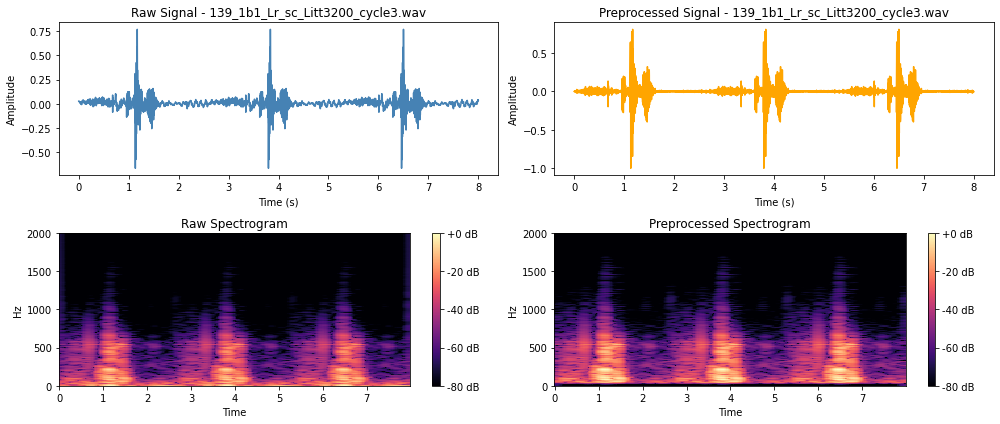

In [325]:
from utils.statistics_and_visuals import plot_signals_after_preprocessing

plot_signals_after_preprocessing(
    train_df=final_train_df,
    corrected_folder=CLEANED_CYCLE_FOLDER,
    raw_folder=RAW_CYCLE_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE,
    k=5
)

The plots show that **the preprocessed signals appear smoother and more regular in amplitude**, indicating suppression of noise and artifacts. The corresponding **spectrograms reveal better-defined frequency structures and reduced background spectral clutter**. This suggests the preprocessing successfully enhanced the clarity and consistency of the breathing cycles while preserving important acoustic information.

### FEATURE EXTRACTION

For both training and testing set we extract **MFCCs, Log-Mel statistic, temporal and spectral features** from the final respiratory cycles and create a **flattened feature vector of size (frames x features, 1)** for each one of them. Also the **frame length of each cycle is set to 60 ms** with an **overlap of 50%**. These values perform well in terms of low frequency respiratory sounds. For the STFT that is calculated on the features we apply **Hann Window** to smoothen the data leakage. In total **267 frames are used for each respiratory cycle**. Also, the features are extracted across the whole .wav file so that no significant information is omitted.

In [ ]:
from utils.audio_preprocessing import classify, extract_acoustic_features

augmented_labels_dict = dict(zip(augmented_labels_df["file"], augmented_labels_df["class"]))

sets = {
    "training": final_train_df,
    "testing": test_df
}

# Extract the features from both training and testing set
for split_name, df_subset in sets.items():
    features = []
    labels = []
    filenames = []
    cycles = []

    for fname in tqdm(df_subset["file"], desc=f"Extracting features for {split_name} set"):
        path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
        if not os.path.exists(path):
            print(f"Missing file: {fname}")
            continue

        y, sr = librosa.load(path, sr=SAMPLING_RATE)

        # Extract frame-level features for each respiratory cycle
        feats = extract_acoustic_features(
            y, sr,
            frame_size=FRAME_SIZE,
            hop_size=HOP_SIZE,
            n_mfcc=N_MFCC,
            n_mels=N_MELS
        )

        # Flatten the features for the entire cycle
        feats_flattened = feats.flatten() # (frames × features, )

        # Find label that corresponds to this cycle
        if fname.startswith("AUG_"):
            label = augmented_labels_dict.get(fname)
            if label is None:
                print(f"Warning: No label found for {fname}")
                continue
        else:
            original_file_base = "_".join(fname.split("_")[:-1])
            match = re.search(r"_cycle(\d+)", fname)
            if match:
                cycle_num = int(match.group(1))
            else:
                print(f"Warning: No cycle info in {fname}")
                continue

            annotation_path = os.path.join(AUDIO_FOLDER, original_file_base + ".txt")
            if not os.path.exists(annotation_path):
                print(f"Missing annotation: {annotation_path}")
                continue

            annotations = np.loadtxt(annotation_path)
            if cycle_num >= annotations.shape[0]:
                print(f"Invalid cycle index for {fname}")
                continue

            crackle = int(annotations[cycle_num, 2])
            wheeze = int(annotations[cycle_num, 3])
            label = classify(crackle, wheeze)

        features.append(feats_flattened)
        labels.append(label)
        filenames.append(fname)
        cycles.append(cycle_num)

    # Convert into arrays and store in .npy files for faster handling
    np.save(f"{split_name}_features.npy", np.vstack(features)) # (cycles, frames x features)
    np.save(f"{split_name}_labels.npy", np.array(labels)) # (cycles,)
    np.save(f"{split_name}_filenames.npy", np.array(filenames)) # (cycles,)
    np.save(f"{split_name}_cycles.npy", np.array(cycles)) # (cycles,)



Processing training set...


Extracting features for training: 100%|██████████| 11652/11652 [05:34<00:00, 34.88it/s]


Training set saved: 11652 samples

Processing testing set...


Extracting features for testing: 100%|██████████| 1380/1380 [00:27<00:00, 49.46it/s]


Testing set saved: 1380 samples


In [ ]:
# Check if the training features array and testing features array are in correct format (cycles, frames x features)
training_features = np.load("training_features.npy")
testing_features = np.load("testing_features.npy")
print("Training features shape:", training_features.shape)
print("Testing features shape:", testing_features.shape)

Training features shape: (11652, 5874)
Testing features shape: (1380, 5874)


In [48]:
# Combine training and testing .npy files into one .npy file 
merged_features = np.vstack([training_features, testing_features])
np.save("features.npy", merged_features)

training_labels = np.load("training_labels.npy")
testing_labels = np.load("testing_labels.npy")
merged_labels = np.concatenate([training_labels, testing_labels])
np.save("labels.npy", merged_labels)

training_filenames = np.load("training_filenames.npy")
testing_filenames = np.load("testing_filenames.npy")
np.save("filenames.npy", np.concatenate([training_filenames, testing_filenames]))

training_cycles = np.load("training_cycles.npy")
testing_cycles = np.load("testing_cycles.npy")
np.save("cycles.npy", np.concatenate([training_cycles, testing_cycles]))

### FEATURE SELECTION


On the training data we visualize the temporal behavior and discriminative power of a specific audio feature across respiratory cycles. Firstly, we **plot how the feature evolves over time for individual cycles, colored by class**. Secondly, we **plot the average per-frame feature values for each class**, highlighting potential separability. Thirdly, we **display the statistical significance (F-value and -log10(p-value))** of the feature at each frame, indicating when it best differentiates between classes.

In [312]:
# Load the training set data
features = np.load("training_features.npy")  
labels = np.load("training_labels.npy")  
filenames = np.load("training_filenames.npy")

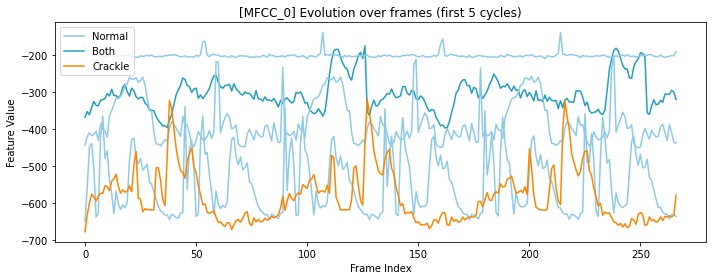

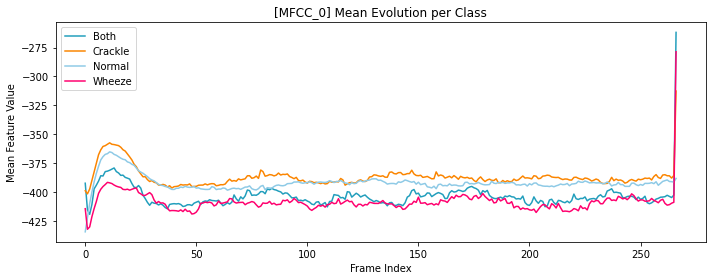

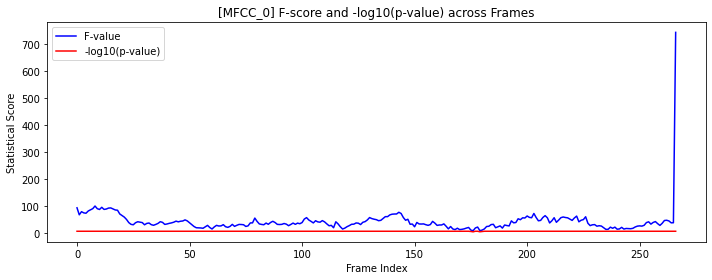

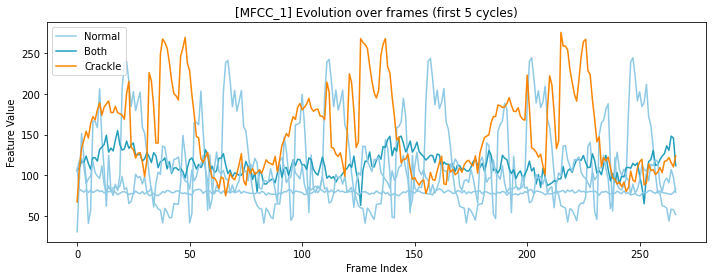

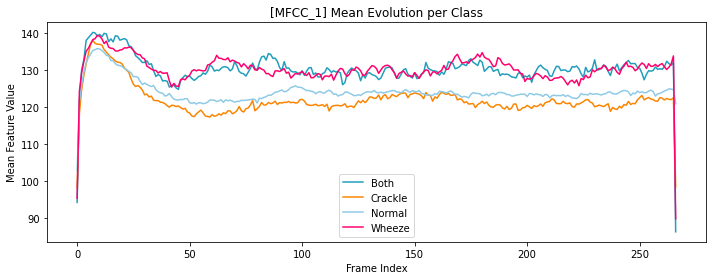

...

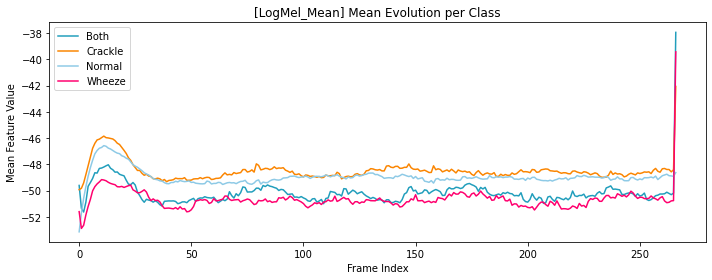

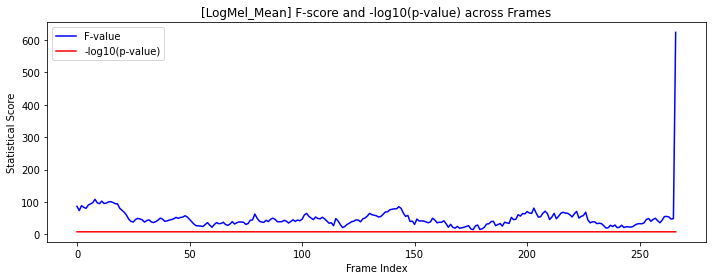

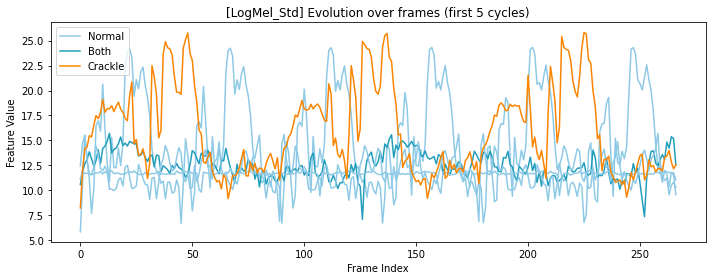

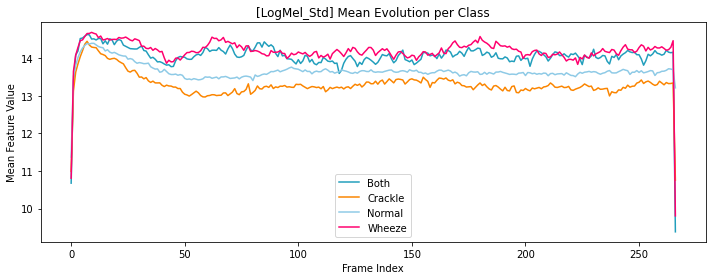

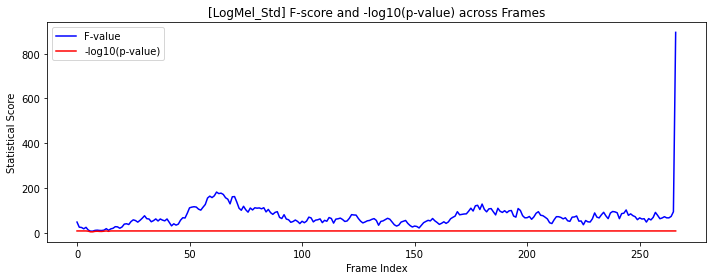

In [ ]:
from utils.statistics_and_visuals import plot_feature_diagnostics

plot_feature_diagnostics(features, labels, FEATURE_NAMES, N_FRAMES, N_FEATURES, n_cycles_to_plot=5)

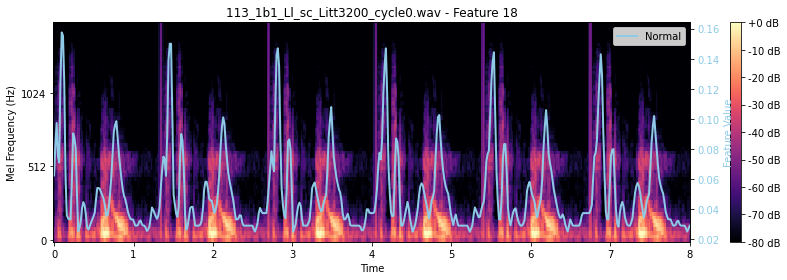

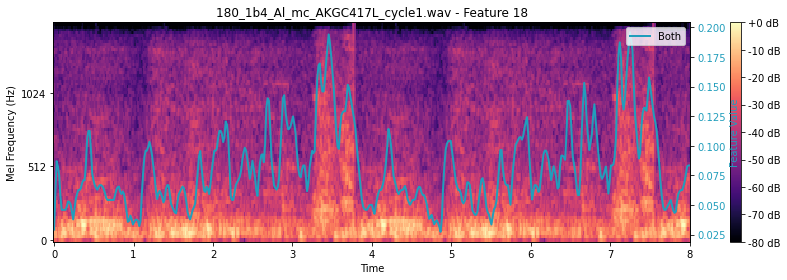

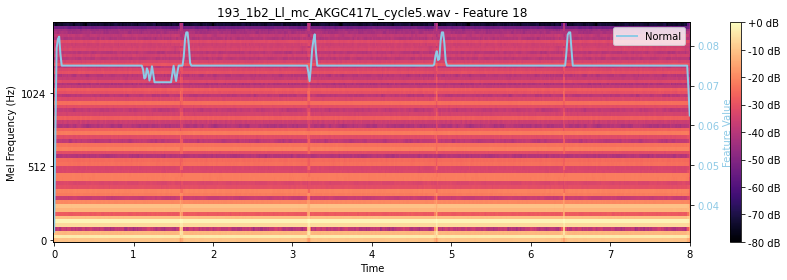

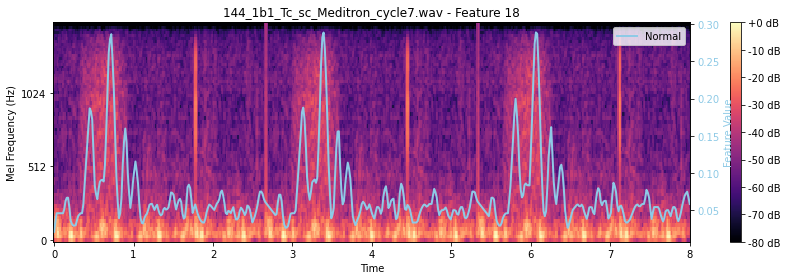

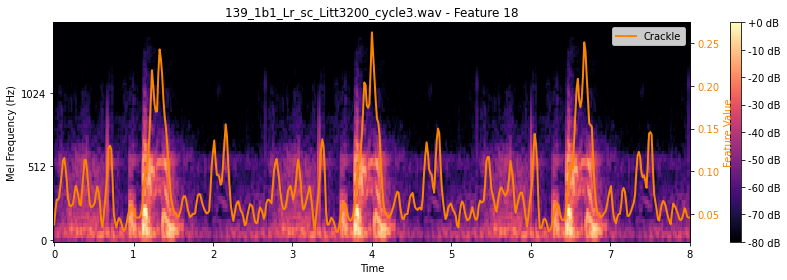

In [ ]:
from utils.statistics_and_visuals import plot_feature_on_spectrogram

# Overlay for example ZCR on the corresponding spectrogram for the first 5 cycles of training set
for i in range(5):
    plot_feature_on_spectrogram(
        fname=filenames[i],
        feature_vector=features[i],
        label=labels[i],
        feature_index=18,  # ZCR
        num_features=N_FEATURES,
        sampling_rate=SAMPLING_RATE,
        frame_length=FRAME_LENGTH,  
        hop_length=HOP_LENGTH,
        n_mels=N_MELS
    )

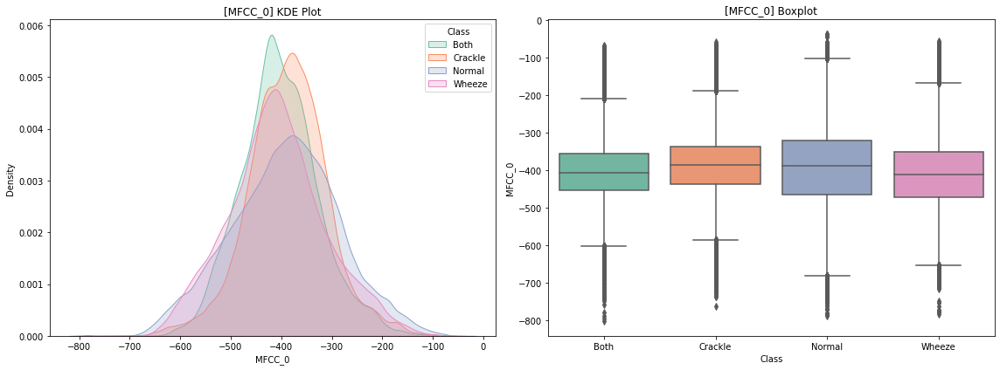

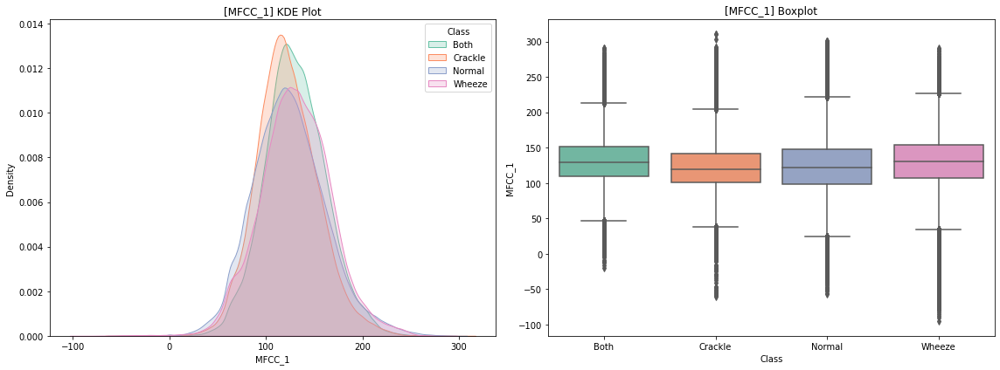

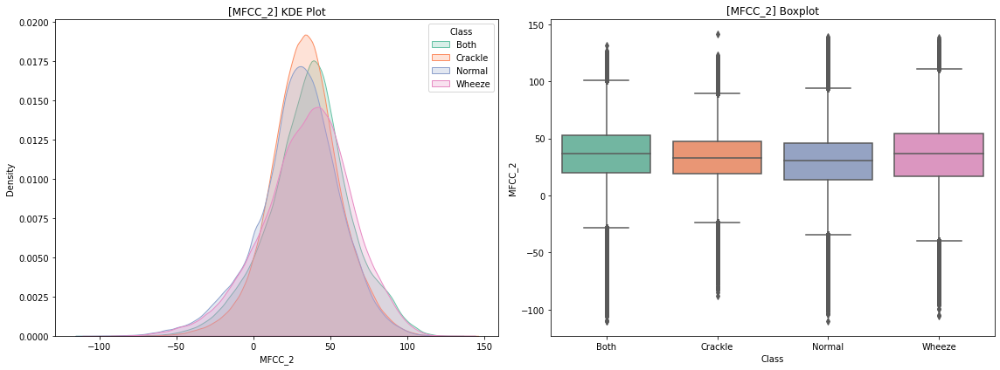

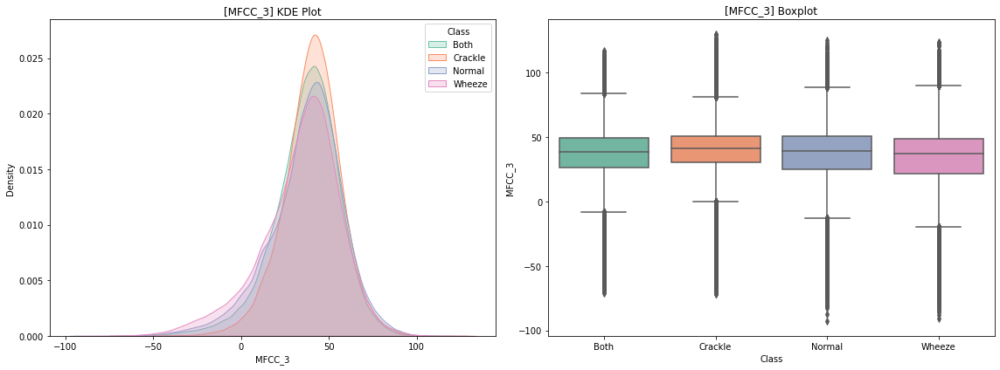

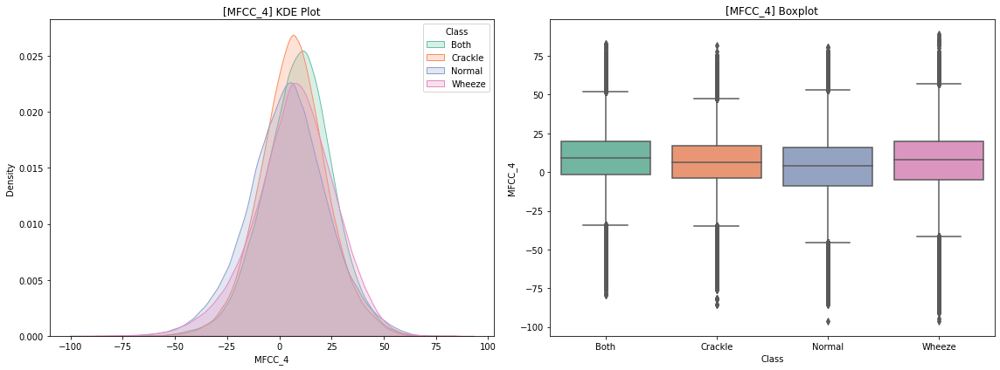

...

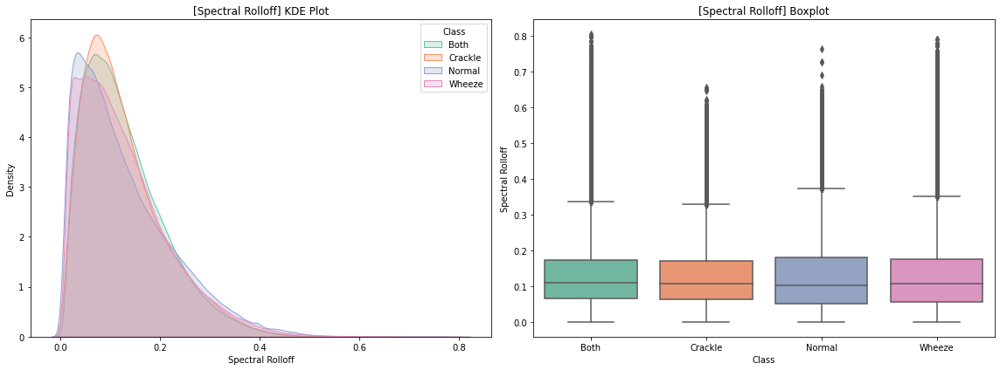

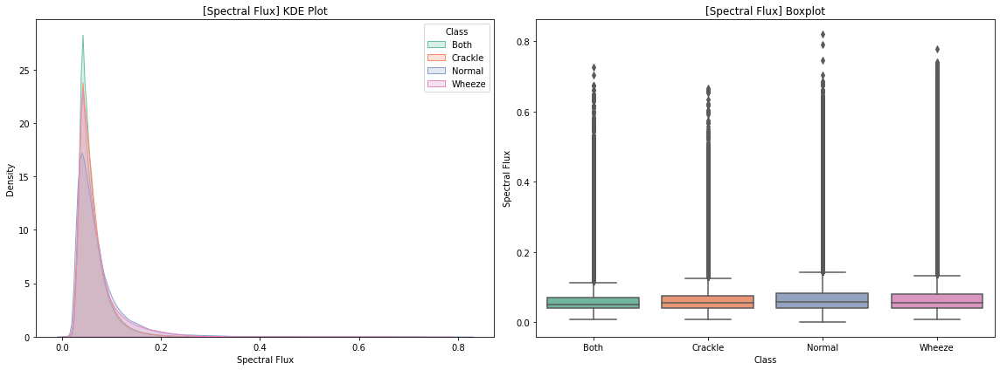

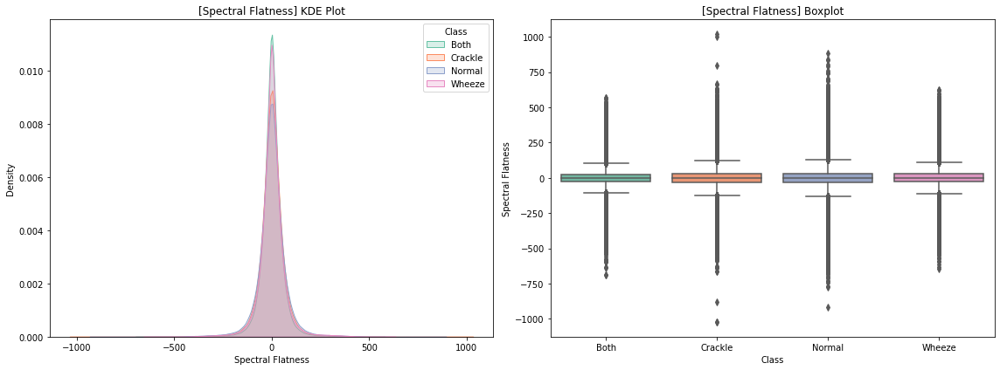

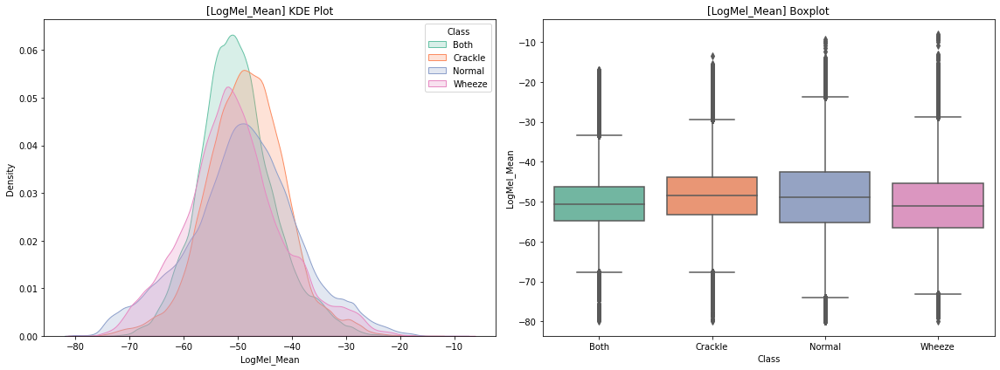

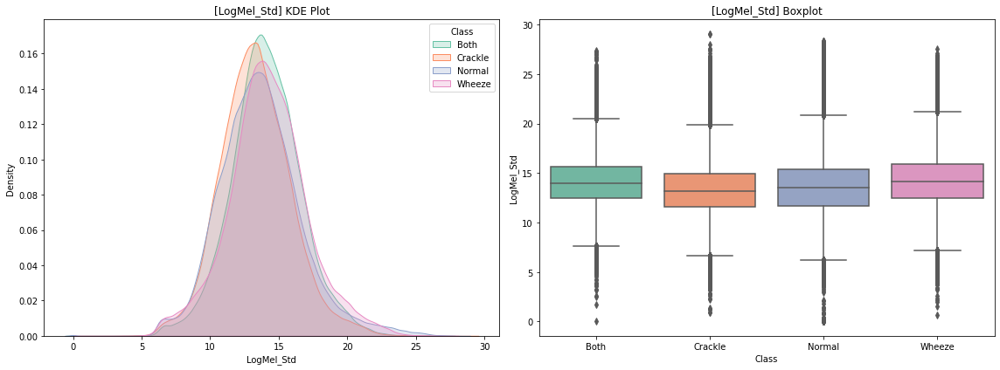

In [317]:
from utils.visuals_and_statistics_plots import plot_feature_distributions

plot_feature_distributions(
    features=features,          
    labels=labels,             
    feature_names=FEATURE_NAMES,
    num_frames=N_FRAMES,
    label_palette="Set2"
)

Finally, we apply **PCA / t-SNE** in 2D and 3D on the training set to determine visually whether the extracted features can help discriminate naturally the abnormal sounds into separate clusters. We also **calculate the contribution of each feature** in order to select only those features that contribute the most.

1. Keep all the extracted features

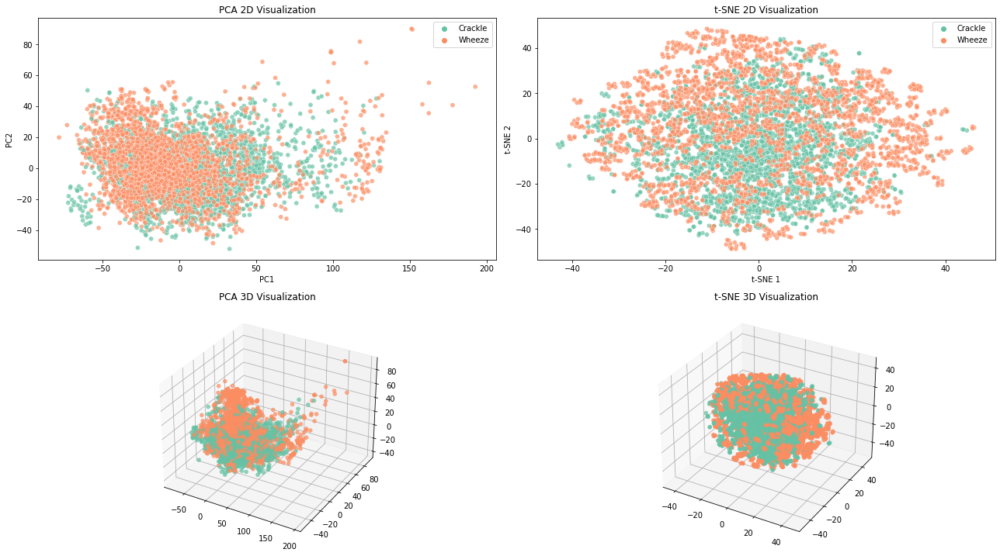

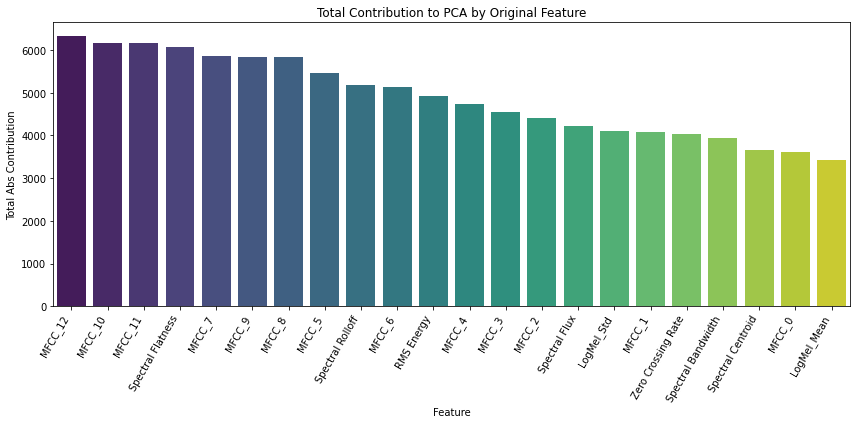

In [ ]:
from utils.statistics_and_visuals import perform_pca_and_tsne

# Keep only Crackle and Wheeze cycles
mask = np.isin(labels, ["Crackle", "Wheeze"])
X = features[mask]
y = labels[mask]

perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=N_FEATURES,
    feature_names=FEATURE_NAMES
)

2. Keep only the selected features and choose the final features for the classification based on the PCA/t-SNE results

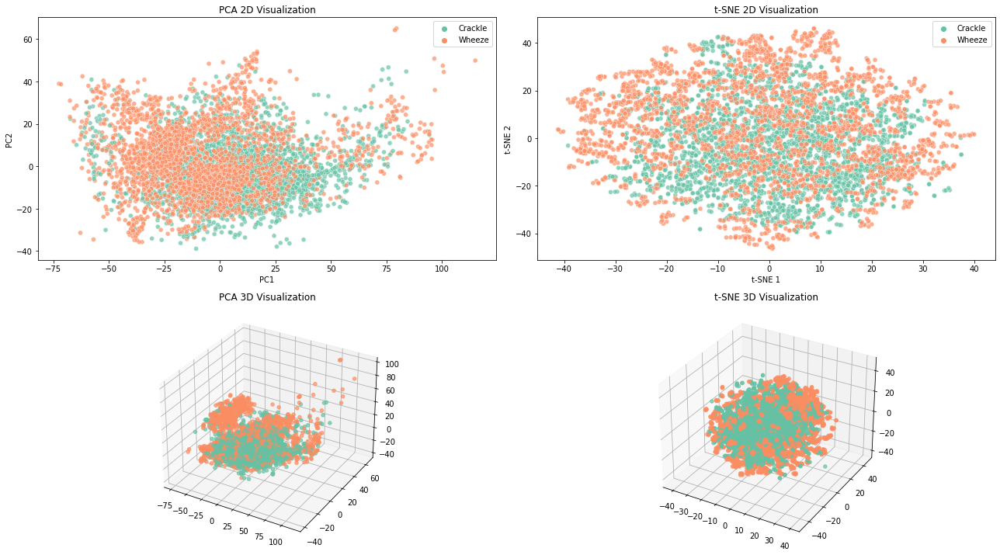

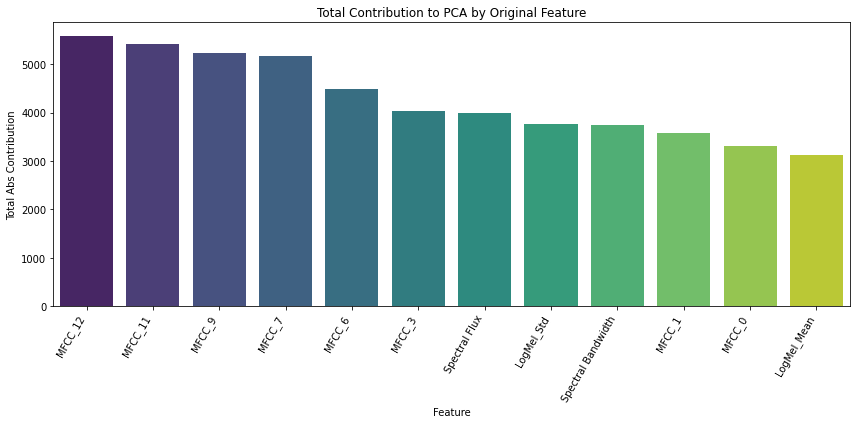

In [319]:
# Keep only Crackle and Wheeze cycles
mask = np.isin(labels, ["Crackle", "Wheeze"])
X_full = features[mask]
y = labels[mask]

# Define the features we want to keep per frame (in frame-wise indexing for the array)
frame_indices_to_keep = [0, 1, 3, 6, 7, 9, 11, 12, 14, 18, 20, 21]
selected_indices = []
for f in range(N_FRAMES):
    base = f * N_FEATURES
    selected_indices.extend([base + i for i in frame_indices_to_keep])

X = X_full[:, selected_indices]

# Run PCA and t-SNE
perform_pca_and_tsne(
    feature_matrix=X,
    labels=y,
    pca_components=0.95, # Keep 95% of variance
    tsne_components=3,
    perplexity=30,
    n_features=len(frame_indices_to_keep),  # 12 selected features
    feature_names=[FEATURE_NAMES[i] for i in frame_indices_to_keep]
)

### CRACKLES VS WHEEZES - BINARY CLASSIFICATION

We train a **Random Forrest Classifier** to check whether it can discriminate between the 2 labels with good accuracy, since PCA / t-SNE haven't helped discriminate the 2 labels visually as expected. We apply 5-fold Stratified Cross Validation and plot also the confusion matrices and the ROC curves for each fold. In the end, we calculate the mean AUC value and check the overall performance of the classifier.

1. Use all the extracted features


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.80      0.87      0.83       373
      Wheeze       0.66      0.55      0.60       177

    accuracy                           0.77       550
   macro avg       0.73      0.71      0.72       550
weighted avg       0.76      0.77      0.76       550

[[323  50]
 [ 79  98]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.81      0.86      0.83       373
      Wheeze       0.66      0.58      0.61       177

    accuracy                           0.77       550
   macro avg       0.73      0.72      0.72       550
weighted avg       0.76      0.77      0.76       550

[[320  53]
 [ 75 102]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.81      0.87      0.84       373
      Wheeze       0.68      0.56      0.62       177

    accuracy                           0.77       550
   macro avg       0.74      0.72 

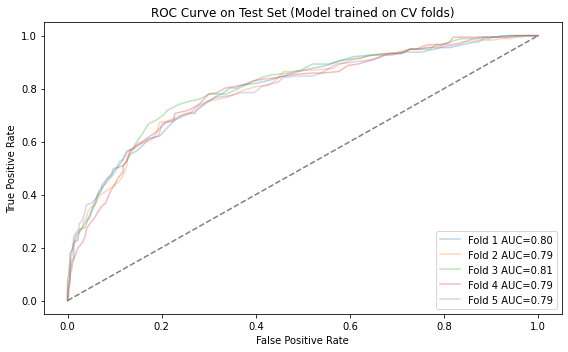


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.81      0.87      0.84      1865
      Wheeze       0.67      0.57      0.61       885

    accuracy                           0.77      2750
   macro avg       0.74      0.72      0.72      2750
weighted avg       0.76      0.77      0.76      2750

Average AUC: 0.7972705654261523


In [ ]:
from utils.statistics_and_visuals import evaluate_random_forest

X_train = np.load("training_features.npy")
y_train = np.load("training_labels.npy")
X_test = np.load("testing_features.npy")
y_test = np.load("testing_labels.npy")

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

2. Use only the initial selected features


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.76      0.88      0.82       373
      Wheeze       0.63      0.42      0.50       177

    accuracy                           0.73       550
   macro avg       0.70      0.65      0.66       550
weighted avg       0.72      0.73      0.72       550

[[330  43]
 [103  74]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.77      0.87      0.82       373
      Wheeze       0.62      0.44      0.52       177

    accuracy                           0.73       550
   macro avg       0.70      0.66      0.67       550
weighted avg       0.72      0.73      0.72       550

[[326  47]
 [ 99  78]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.76      0.86      0.81       373
      Wheeze       0.59      0.41      0.49       177

    accuracy                           0.72       550
   macro avg       0.67      0.64 

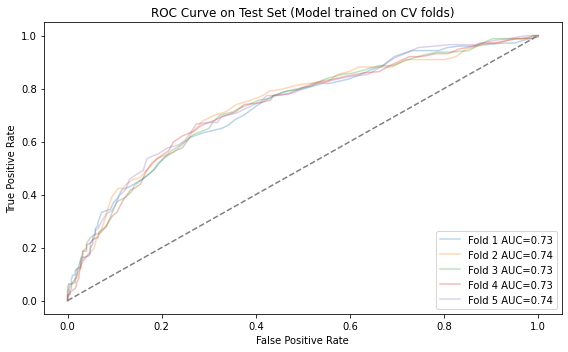


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.76      0.87      0.81      1865
      Wheeze       0.61      0.43      0.50       885

    accuracy                           0.73      2750
   macro avg       0.69      0.65      0.66      2750
weighted avg       0.71      0.73      0.71      2750

Average AUC: 0.733048575453265


In [321]:
X_train_full = np.load("training_features.npy")
y_train = np.load("training_labels.npy")
X_test_full = np.load("testing_features.npy")
y_test = np.load("testing_labels.npy")

# Feature selection 
frame_indices_to_keep = [6, 7, 9, 11, 12]
selected_indices = []
for frame in range(N_FRAMES):
    base = frame * N_FEATURES
    selected_indices.extend([base + i for i in frame_indices_to_keep])

X_train = X_train_full[:, selected_indices]
X_test = X_test_full[:, selected_indices]

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

3. Use only the final features after selection and PCA/t-SNE


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.76      0.88      0.82       373
      Wheeze       0.63      0.42      0.50       177

    accuracy                           0.73       550
   macro avg       0.70      0.65      0.66       550
weighted avg       0.72      0.73      0.72       550

[[330  43]
 [103  74]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.77      0.87      0.82       373
      Wheeze       0.62      0.44      0.52       177

    accuracy                           0.73       550
   macro avg       0.70      0.66      0.67       550
weighted avg       0.72      0.73      0.72       550

[[326  47]
 [ 99  78]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.76      0.86      0.81       373
      Wheeze       0.59      0.41      0.49       177

    accuracy                           0.72       550
   macro avg       0.67      0.64 

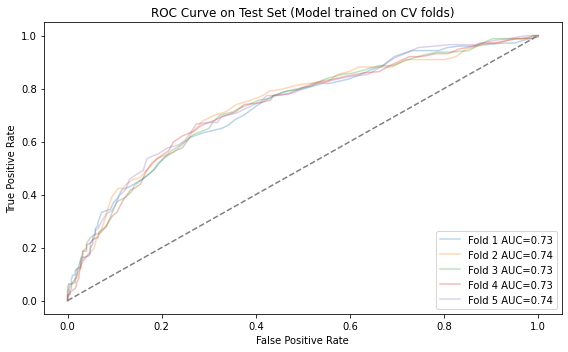


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.76      0.87      0.81      1865
      Wheeze       0.61      0.43      0.50       885

    accuracy                           0.73      2750
   macro avg       0.69      0.65      0.66      2750
weighted avg       0.71      0.73      0.71      2750

Average AUC: 0.733048575453265


In [322]:
X_train_full = np.load("training_features.npy")
y_train = np.load("training_labels.npy")
X_test_full = np.load("testing_features.npy")
y_test = np.load("testing_labels.npy")

# Feature selection 
frame_indices_to_keep = [6, 7, 9, 11, 12]
selected_indices = []
for frame in range(N_FRAMES):
    base = frame * N_FEATURES
    selected_indices.extend([base + i for i in frame_indices_to_keep])

X_train = X_train_full[:, selected_indices]
X_test = X_test_full[:, selected_indices]

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

We now apply **Spectrum Correction** to see how much the classification performance of the labels will be enhanced. First apply the correction in the training set and then in the testing set, since all .wav files must be mapped into the same device spectrum. After this, we extract the same acoustic features from the corrected wav files. Finally, we do again the classification just like before.

In [ ]:
from utils.spectrum_correction import SpectrumCorrection

CORRECTED_TRAIN_FOLDER = "corrected_train"
os.makedirs(CORRECTED_TRAIN_FOLDER, exist_ok=True)

# Get the files of the training test for each recording device 
devices = ["AKGC417L", "LittC2SE", "Litt3200", "Meditron"]
device_segments = {d: [] for d in devices}
device_files = {d: [] for d in devices}

for fname in final_train_df["file"]:
    device = next((d for d in devices if d in fname), None)
    if device:
        path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].append(y)
        device_files[device].append((fname, y))

# Find coomon (aligned) segments
min_files = min(len(device_segments[d]) for d in devices)
aligned_segments = [
    {device: device_segments[device][i] for device in devices}
    for i in range(min_files)
]

# Fit Spectrum Correction
correction = SpectrumCorrection(num_fft=FRAME_SIZE, hop_length=HOP_SIZE)
correction.fit(aligned_segments, reference=REFERENCE_DEVICE)

# Apply Spectrum Correction only on non-reference devices of training set 
for fname in final_train_df["file"]:
    device = next((d for d in devices if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(CORRECTED_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

In [ ]:
CORRECTED_TEST_FOLDER = "corrected_test"
os.makedirs(CORRECTED_TEST_FOLDER, exist_ok=True)

# Apply Spectrum Correction only on non-reference devices of testing set 
for fname in test_df["file"]:
    device = next((d for d in devices if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(CORRECTED_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

In [ ]:
# Check if all folders have the correct amount of files
folders = {
    "RAW": RAW_CYCLE_FOLDER,
    "TRAIN_CORRECTED": CORRECTED_TRAIN_FOLDER,
    "TEST_CORRECTED": CORRECTED_TEST_FOLDER,
    "AUGMENTED": AUG_CYCLE_FOLDER,
    "CLEANED": CLEANED_CYCLE_FOLDER
}

for name, path in folders.items():
    n_files = len([f for f in os.listdir(path) if f.endswith(".wav")])
    print(f"{name}: {n_files} .wav files")

RAW: 6898 .wav files
TRAIN_CORRECTED: 11652 .wav files
TEST_CORRECTED: 1380 .wav files
AUGMENTED: 6134 .wav files
CLEANED: 13032 .wav files


After the correction we visualize the first 5 instances of the training set to see how the waveforms and the spectrograms have altered.

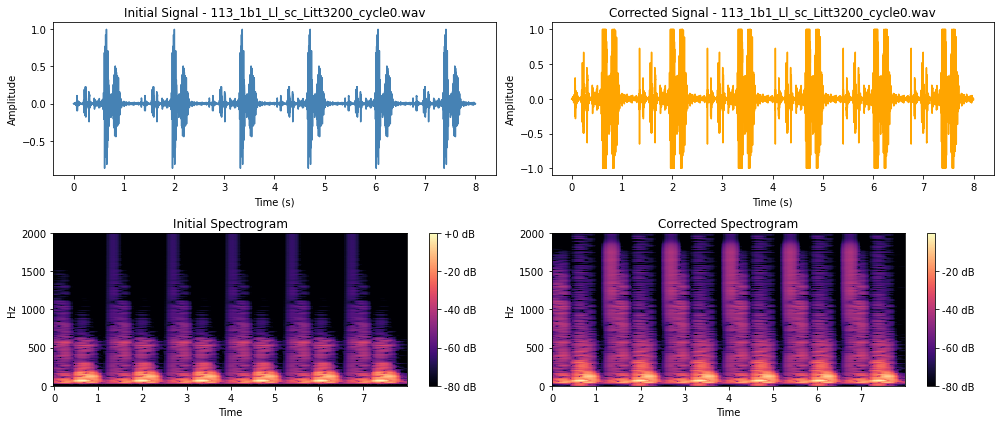

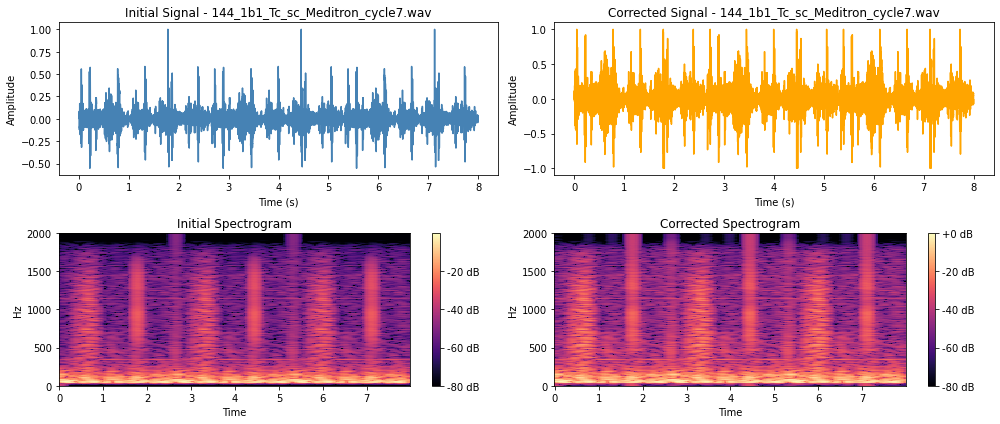

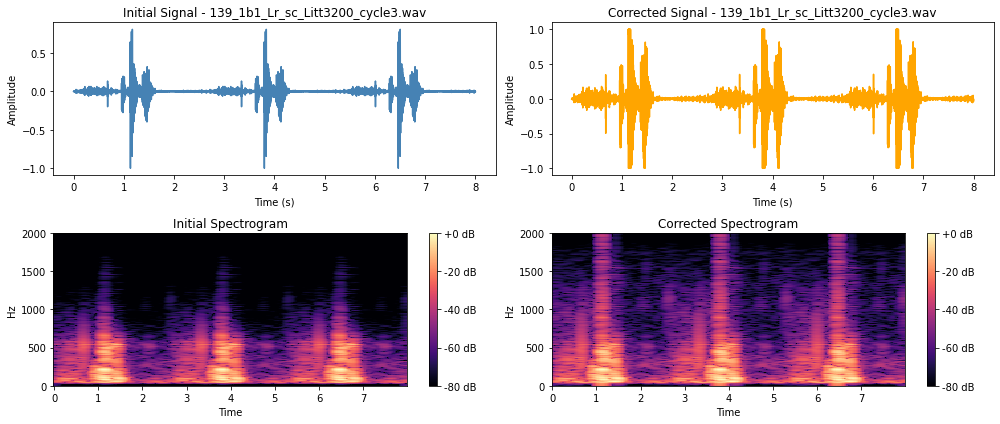

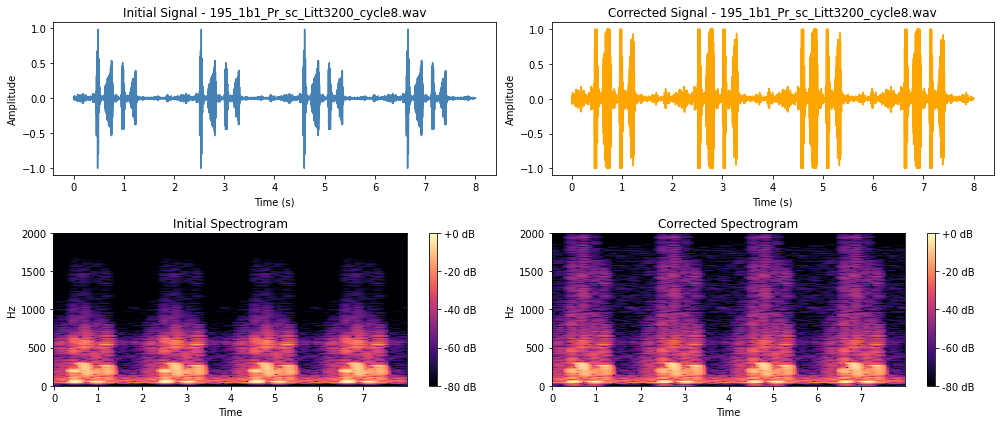

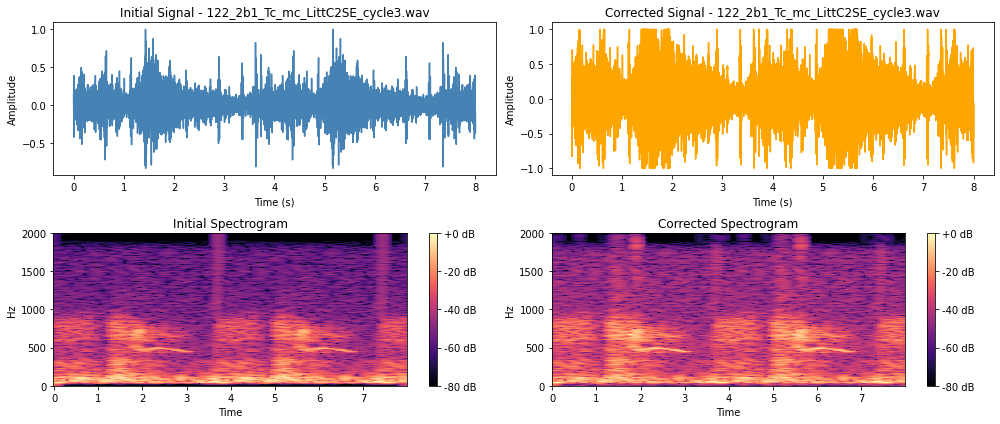

In [ ]:
from utils.statistics_and_visuals import plot_signals_after_spectrum_correction

# Get the first 5 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains("AKGC417L")]["file"].tolist()[:5]

plot_signals_after_spectrum_correction(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=CORRECTED_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

From the plots, we observe that **the Spectrum Correction effectively homogenizes the signals across devices**. The corrected signals exhibit **smoother spectral distributions with reduced noise, especially in higher frequencies**. There’s also a **more balanced amplitude and a noticeable reduction of device-specific artifacts like vertical spectral lines**. Overall, the signals become more consistent, which is expected to improve model generalization by minimizing device-induced variability.

After the correction we extract the same acoustic features from the corrected .wav files both in training and testing sets.

In [ ]:
from utils.audio_preprocessing import extract_acoustic_features, classify

CORRECTED_TRAIN_FOLDER = "corrected_train"

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(CORRECTED_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected train"):
    path = os.path.join(CORRECTED_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats.flatten())
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.vstack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

np.save("corrected_train_features.npy", train_features_array)
np.save("corrected_train_filenames.npy", train_filenames_array)
np.save("corrected_train_labels.npy", train_labels_array)

Extracting features from corrected train: 100%|██████████| 11652/11652 [14:07<00:00, 13.75it/s]


In [ ]:
from utils.audio_preprocessing import extract_acoustic_features, classify

CORRECTED_TEST_FOLDER = "corrected_test"

# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(CORRECTED_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test"):
    path = os.path.join(CORRECTED_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats.flatten())
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays 
test_features_array = np.vstack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

np.save("corrected_test_features.npy", test_features_array)
np.save("corrected_test_filenames.npy", test_filenames_array)
np.save("corrected_test_labels.npy", test_labels_array)

Extracting features from corrected test: 100%|██████████| 1380/1380 [02:26<00:00,  9.42it/s]


1. Use all the extracted features


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.83      0.88      0.85       373
      Wheeze       0.71      0.62      0.66       177

    accuracy                           0.79       550
   macro avg       0.77      0.75      0.76       550
weighted avg       0.79      0.79      0.79       550

[[328  45]
 [ 68 109]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.82      0.87      0.85       373
      Wheeze       0.69      0.61      0.65       177

    accuracy                           0.79       550
   macro avg       0.76      0.74      0.75       550
weighted avg       0.78      0.79      0.78       550

[[324  49]
 [ 69 108]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.84      0.89      0.86       373
      Wheeze       0.74      0.64      0.68       177

    accuracy                           0.81       550
   macro avg       0.79      0.77 

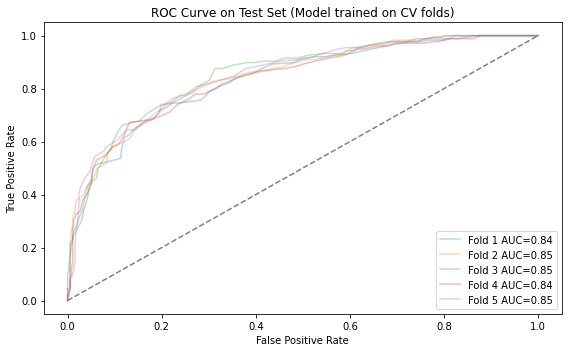


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.83      0.88      0.86      1865
      Wheeze       0.72      0.62      0.66       885

    accuracy                           0.80      2750
   macro avg       0.77      0.75      0.76      2750
weighted avg       0.79      0.80      0.79      2750

Average AUC: 0.8450417291467867


In [326]:
from utils.statistics_and_visuals import evaluate_random_forest

X_train = np.load("corrected_train_features.npy")
y_train = np.load("corrected_train_labels.npy")
X_test = np.load("corrected_test_features.npy")
y_test = np.load("corrected_test_labels.npy")

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

2. Use only the initial selected features


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.82      0.87      0.85       373
      Wheeze       0.69      0.59      0.64       177

    accuracy                           0.78       550
   macro avg       0.75      0.73      0.74       550
weighted avg       0.78      0.78      0.78       550

[[326  47]
 [ 72 105]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.81      0.86      0.84       373
      Wheeze       0.66      0.59      0.62       177

    accuracy                           0.77       550
   macro avg       0.74      0.72      0.73       550
weighted avg       0.77      0.77      0.77       550

[[320  53]
 [ 73 104]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.82      0.88      0.85       373
      Wheeze       0.70      0.59      0.64       177

    accuracy                           0.79       550
   macro avg       0.76      0.74 

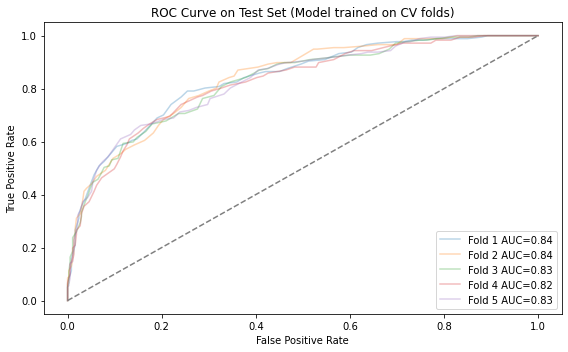


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.82      0.88      0.85      1865
      Wheeze       0.69      0.59      0.64       885

    accuracy                           0.78      2750
   macro avg       0.76      0.73      0.74      2750
weighted avg       0.78      0.78      0.78      2750

Average AUC: 0.8300192363036004


In [327]:
X_train_full = np.load("corrected_train_features.npy")
y_train = np.load("corrected_train_labels.npy")
X_test_full = np.load("corrected_test_features.npy")
y_test = np.load("corrected_test_labels.npy")

# Feature selection 
frame_indices_to_keep = [0, 1, 3, 6, 7, 9, 11, 12, 14, 18, 20, 21]
selected_indices = []
for frame in range(N_FRAMES):
    base = frame * N_FEATURES
    selected_indices.extend([base + i for i in frame_indices_to_keep])

X_train = X_train_full[:, selected_indices]
X_test = X_test_full[:, selected_indices]

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

3. Use only the final features after selection and PCA/t-SNE


Fold 1 Report:
              precision    recall  f1-score   support

     Crackle       0.78      0.77      0.77       373
      Wheeze       0.52      0.54      0.53       177

    accuracy                           0.69       550
   macro avg       0.65      0.65      0.65       550
weighted avg       0.70      0.69      0.70       550

[[287  86]
 [ 82  95]]

Fold 2 Report:
              precision    recall  f1-score   support

     Crackle       0.80      0.78      0.79       373
      Wheeze       0.55      0.58      0.57       177

    accuracy                           0.71       550
   macro avg       0.67      0.68      0.68       550
weighted avg       0.72      0.71      0.72       550

[[291  82]
 [ 75 102]]

Fold 3 Report:
              precision    recall  f1-score   support

     Crackle       0.80      0.78      0.79       373
      Wheeze       0.56      0.59      0.57       177

    accuracy                           0.72       550
   macro avg       0.68      0.68 

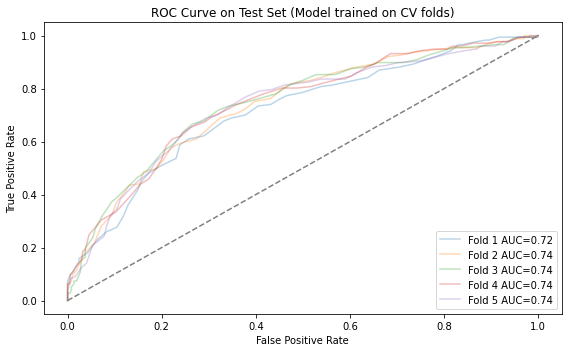


=== Overall Performance on Test Set ===
              precision    recall  f1-score   support

     Crackle       0.79      0.78      0.79      1865
      Wheeze       0.55      0.57      0.56       885

    accuracy                           0.71      2750
   macro avg       0.67      0.68      0.67      2750
weighted avg       0.72      0.71      0.71      2750

Average AUC: 0.7350115872222474


In [328]:
X_train_full = np.load("corrected_train_features.npy")
y_train = np.load("corrected_train_labels.npy")
X_test_full = np.load("corrected_test_features.npy")
y_test = np.load("corrected_test_labels.npy")

# Feature selection 
frame_indices_to_keep = [6, 7, 9, 11, 12]
selected_indices = []
for frame in range(N_FRAMES):
    base = frame * N_FEATURES
    selected_indices.extend([base + i for i in frame_indices_to_keep])

X_train = X_train_full[:, selected_indices]
X_test = X_test_full[:, selected_indices]

evaluate_random_forest(
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    positive_label="Wheeze",
    negative_label="Crackle"
)

### Summary and Conclusions

Key conclusions from the experiments:

**Feature Importance**: Feature-wise diagnostics (e.g., F-values and class-wise KDE plots) showed that certain features like ZCR, spectral centroid, and high-order MFCCs provide higher class separability between "Crackle" and "Wheeze". PCA and t-SNE projections revealed partial separability of classes in latent space, particularly when using selected features with high F-score or ANOVA significance.

**Classification Performance**: The trained classifier performs well across all respiratory sound categories, though minor accuracy drops were observed when aggressive feature selection was applied. This suggests that even "less informative" features may carry complementary signal useful for classification.

**Spectrum Correction Impact**: Visual inspection of waveforms and spectrograms before and after spectrum correction confirms that spectral energy distribution becomes more consistent across devices, which likely improves model generalization.